In [541]:
# !pip install geopandas
# !pip install pgeocode
# !pip install folium
# !pip install pyshp
# !pip install haversine
# !pip install k-means-constrained
# !pip install k-means-constrained --target /opt/conda/lib/python3.8/site-packages
# !pip install --upgrade numpy --target /opt/conda/lib/python3.8/site-packages

  Using cached https://files.pythonhosted.org/packages/a6/92/5ddb9aab70fcca4b35e4b0b7ba1c1f994873cb13b139f4846a621bbcc936/geopandas-0.10.2-py2.py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/ec/f7/093890341a7e8fbfcdfa04caf4dfb588ebab32c13ceaa6a3819da79ea106/Fiona-1.8.20.tar.gz


    ERROR: Command errored out with exit status 1:
     command: 'C:\Users\ruta.deshmukh.NEW_STERLING\AppData\Local\Continuum\anaconda3\python.exe' -c 'import sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\RUTADE~1.NEW\\AppData\\Local\\Temp\\pip-install-9ppi5g_s\\fiona\\setup.py'"'"'; __file__='"'"'C:\\Users\\RUTADE~1.NEW\\AppData\\Local\\Temp\\pip-install-9ppi5g_s\\fiona\\setup.py'"'"';f=getattr(tokenize, '"'"'open'"'"', open)(__file__);code=f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' egg_info --egg-base pip-egg-info
         cwd: C:\Users\RUTADE~1.NEW\AppData\Local\Temp\pip-install-9ppi5g_s\fiona\
    Complete output (1 lines):
    A GDAL API version must be specified. Provide a path to gdal-config using a GDAL_CONFIG environment variable or use a GDAL_VERSION environment variable.
    ----------------------------------------
ERROR: Command errored out with exit status 1: python setup.py egg_info Check the logs for

In [1]:
import geopandas as gpd
import fiona

In [2]:
# 1) Get fake jobs for zipcodes in Orlando
# 2) Get problem descriptions for the jobs and predict parts START HERE
# 3) Create part stock list - top 10 model ice maker kits
# 4) Flag same day fix
# 5) run against current availibility mapping with agents

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import random
import sqlalchemy, os
import pandas as pd
import numpy as np
np.random.seed(201912)
import matplotlib.pyplot as plt
from datetime import datetime as dt
import pickle
from retail_toolkit import atlas
from retail_toolkit import credential_manager as cm
from numpy import average
import time

In [4]:
import requests
import json
from collections import Counter
from random import choices

In [5]:
import folium
from folium import plugins
# import geopandas as gpd
from folium.plugins import HeatMap
from shapely.geometry import Point, Polygon
import shapefile
from IPython.display import display

In [6]:
from k_means_constrained import KMeansConstrained

In [7]:
import pgeocode
from haversine import haversine, Unit
from kneed import KneeLocator

In [8]:
# Applying simple kmeans
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples
import matplotlib.pyplot as plt

In [9]:
import color_scheme
mapping = color_scheme.create_mapping()

In [360]:
def determine_clust_centroids(model, dataset, level, cluster_number):
    clusters_centroids=dict()
    clusters_radii= dict()
    for cluster in list(range(model.n_clusters)):
        if level == 1:
            key = str(cluster_number)
        else:
            key = str(cluster_number + cluster/10)
        clusters_centroids[key]=list(zip(model.cluster_centers_[:, 0],model.cluster_centers_[:,1]))[cluster]
        clusters_radii[key] = max([haversine(i,clusters_centroids[key]) for i in list(zip(dataset[dataset.assigned_clusters == cluster]['lat'],dataset[dataset.assigned_clusters == cluster]['lon']))])
    return(clusters_centroids,clusters_radii)

In [139]:
def apply_constraint_kmeans(num_of_clusters, size_min, size_max, df):
    clf = KMeansConstrained(
    n_clusters=num_of_clusters,
    size_min=size_min,
    size_max=size_max,
    random_state=0)
    
    return(clf.fit_predict(df[['lat','lon']]), clf)

def apply_kmeans(num_of_clusters, df):
    kmeans=KMeans(n_clusters=num_of_clusters, init='k-means++',random_state=0).fit(df[['lat','lon']])
    return(kmeans.fit_predict(df[['lat','lon']]), kmeans)

In [10]:
def analysis(lat1, long1, lat2, long2):
#     This function gets time taken to traven and distance between two points using OSRM package
# The server on ip 100.70.175.6 has to be started before executing code below. Please contact Suresh to turn it on. 
    time.sleep(3)
    url = 'http://100.70.175.6:5000/route/v1/driving/{},{};{},{}'
    r = requests.get(url.format(long1,lat1,long2,lat2)).text
    data = json.loads(r)
    try:
        distance = round(data["routes"][0]["distance"]*0.621371/1000, 1)
        duration = round(data["routes"][0]["duration"]/60, 1)
        return([distance,duration])
    except KeyError:
        return([-1.0,-1.0])

In [11]:
def function_distance(group, clusters_centroid):
    empty_list = []
    for index, i in group.iterrows():
        loc2 = (float(i['lat']),float(i['lon']))
#         print(loc2)
        empty_list.append(haversine(clusters_centroid,loc2,unit=Unit.MILES))
    return(empty_list)

def dist_from_centroid(group, centroid):
    empty_list = []
    for index, each in group.iterrows(): 
        empty_list.append(haversine(centroid, (each['lat'],each['lon'] ), unit='mi'))
    return(empty_list)

def popu_in_30_mins(s_df):
    # This function gets all zip codes within 30mins driving distance of each zip and sums the population.
    empty_list = []
    for index, each in s_df.iterrows():
    #     print(each.cust_zip)
        demand_within_30mins = 0
        for index, row in s_df.iterrows():
    #         print(analysis(each.Latitude,each.Longitude, row.Latitude,row.Longitude))
            if analysis(each.lat_zip,each.lon_zip, row.lat_zip,row.lon_zip)[1] <= 30.0:
    #             print(analysis( each.Longitude,each.Latitude,  row.Longitude,row.Latitude)[1])
    #             print(each.claim_volume)
                demand_within_30mins = demand_within_30mins+row.Population
    #             print(demand_within_30mins)
    #     print(demand_within_30mins)
        empty_list.append(demand_within_30mins)
    return(empty_list)

In [120]:
zip_df = gpd.read_file('C:/Users/ruta.deshmukh.NEW_STERLING/Desktop/All projects/MA_coverage/python notebooks/Archives/zip_level_shape_files/cb_2018_us_zcta510_500k.shp')
zip_df['ZCTA5CE10'] = zip_df['ZCTA5CE10'].astype(str)

def initialize_map(lat, lon, coverage):
    m = folium.Map(location=[lat,lon], zoom_start=8, overlay=True)
    zip_df_market = zip_df[zip_df.ZCTA5CE10.isin(coverage)]
    fg = folium.map.FeatureGroup('coverage').add_to(m)
    for _, r in zip_df_market.iterrows():
            # Without simplifying the representation of each borough,
            # the map might not be displayed
        sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
        geo_j = sim_geo.to_json()
        geo_j = folium.GeoJson(data=geo_j,
                                   style_function=lambda x: {'fillColor': 'orange'}, name = 'coverage')
        folium.Popup('coverage').add_to(geo_j)
        fg.add_child(geo_j)
    return(m)

In [16]:
url = 'http://100.70.180.199:8080/search'

def geocode_address(row):
    params = {
        'street': row.addr_line_1,
        'city': row.address_city,
        'state': row.addr_state,
        'postalcode': row.cust_zip
    }
    # print(params)
    res = requests.get(url, params=params)
    if res and res.json():
#         print('used adre, city, state')
        return [res.json()[0]['lat'], res.json()[0]['lon']]

#skipping city from parameters increases wrong cordinate rates
#     params = {
#         'street': row.addr_line_1,
#         'state': row.addr_state,
#         'postalcode': row.cust_zip
#     }
#     res = requests.get(url, params=params)
#     if res and res.json():
# #         print('street, state')
#         return [res.json()[0]['lat'], res.json()[0]['lon']]
    
    params = {
        'city': row.address_city,
        'state': row.addr_state,
        'postalcode': row.cust_zip
    }
    res = requests.get(url, params=params)
    if res and res.json():
#         print('city, state')
        return [res.json()[0]['lat'], res.json()[0]['lon']]

    params = {
        'street': row.addr_line_1,
        'city': row.address_city,
        'state': row.addr_state
    }
    res = requests.get(url, params=params)
    if res and res.json():
#         print('city, state')
        return [res.json()[0]['lat'], res.json()[0]['lon']]
    else:
        return 'error'

def geocode_zipcode(row):
    params = {
        'postalcode': row.cust_zip
    }
    # print(params)
    res = requests.get(url, params=params)
    if res and res.json():
#         print('used adre, city, state')
        return [res.json()[0]['lat'], res.json()[0]['lon']]
    else:
        return 'error'

In [17]:
presto_connection =  atlas.Presto(environment = 'presto://{}:{}@atlas-workbench-presto.atlas.prd.aws.asurion.net:18443/hive').connect()

In [18]:
coverage_sql = """
select 
    com.name,
    sp.service_provider_id,
    dl.name location_name,
    atlasdecrypt(dl.address_line1_token) address,
    dl.address_city,
    dl.address_state,
    dl.address_zip,
    spl.service_provider_location_id,
    sjz.sj_zone_id,
    sjz.time_zone,
    cov.*
from
    l2_retail.odhsb_sbv5_at_sa_service_provider sp 
    join hive.l2_retail.odhsb_sb_svbt_company com on sp.service_provider_id = com.company_id_char
    join l2_retail.odhsb_sbv5_at_service_provider_location spl on sp.service_provider_id = spl.service_provider_id 
    join hive.l2_retail.odhsb_sb_svbt_dealer_location dl on dl.dealer_location_id_char = spl.service_provider_location_id
--  join l2_retail.odhsb_servicebenchv5_at_sj_first_avail_request far on 
    join l2_retail.odhsb_servicebenchv5_at_sp_service_job_zone sjz on sjz.service_provider_location_id = spl.service_provider_location_id 
--    join hive.l2_retail.odhsb_servicebenchv5_at_sp_sj_zone_coverage_change sjzc on sjzc.sj_zone_id = sjz.sj_zone_id
    join hive.l2_retail.odhsb_servicebench_svbt_dealer_zone_coverage cov on cov.zone_id_char = sjz.sj_zone_id
--    join l2_retail.odhsb_servicebench_svbt_dealer_loc_coverage dlc on cast(dlc.dealer_location_id as varchar)  = spl.service_provider_location_id 
--  join l2_retail.odhsb_servicebench_svbt_manufacturer_dealer_loc mdl on mdl
--    join l2_retail.odhsb_servicebenchv5_at_sp_sj_availability ssa on sjz.sj_zone_id = ssa.sj_zone_id 
where 
    sp.service_administrator_id = '43'
--    and sp.account_number = '0117521'
    --and com.name = 'ASURION REPAIR SERVICES'
    and sp.service_provider_id in ('1133787699','1116738095','1115480731')
    --and sjz.sj_zone_id = '1138146988'
"""

In [19]:
coverage = pd.read_sql(coverage_sql, presto_connection)

In [20]:
coverage= coverage[coverage.location_name == 'ORLANDO'].coverage_zip_code.unique()

In [215]:
# pd.DataFrame(coverage, columns = ['zipcode']).to_csv('coverage_orlando.csv', sep = '|')

In [13]:
# geo_sql = "select * from hive.rtm_analytics.l3_retail_scm_m_geography"
# geo_cordinates = pd.read_sql(geo_sql, presto_connection)

In [21]:
sql = """
select distinct
	sj.service_order_id ,
	so.service_order_number,
	sj.service_job_type_id ,
	sj.payment_type ,
	sj.sj_program_id ,
	sj.external_reference_number ,
	sj.crm_number ,
	sj.service_job_id ,
	sj.service_job_number ,
	sj.service_job_status ,
	sj.service_job_sub_status ,
	sj.service_job_date,
	sj.service_job_source ,
	sj.service_request_type_code ,
	sj.technician_routing_status ,
	sj.technician_routing_message ,
	sj.route_order_number ,
	sj.scheduled_service_date,
	coalesce(o.orig_sched_dt, sj.scheduled_service_date) orig_service_dt ,
	sj.problem_description ,
	sj.service_explanation ,
	sj.technician_id ,
	rs.retailer_store_name,
	sprd.model_number,
	sprd.model_version,
	sprd.serial_number,
	sprd.internal_brand_code ,
	sprd.purchase_date ,
	sprd.purchase_price ,
	sprd.manufacturer ,
	sjpl.description industry,
	ftf.min_tech_arrival_dt,
	ftf.min_complete_dt,
	cus.address_line_1 addr_line_1,
	cus.address_city,
	cus.address_province addr_state,
	cus.address_postal_code addr_zip_code,
    dl.name
from
    hive.rtm_analytics.l2_odhsb_sbv5_at_service_job_rs sj 
	join hive.rtm_analytics.l2_odhsb_sbv5_at_service_order_rs so on so.service_order_id = sj.service_order_id 
	join hive.rtm_analytics.l2_odhsb_sbv5_at_sj_part_rs sjp on sj.service_job_id = sjp.service_job_id
	join hive.rtm_analytics.l2_odhsb_sbv5_at_sa_retailer_store_rs rs on	sj.retailer_store_id = rs.retailer_store_id
	join hive.l2_retail.odhsb_sbv5_at_so_product sprd on sprd.service_order_id = so.service_order_id 
	join hive.l2_retail.odhsb_sbv5_at_sa_service_job_product_line sjpl on sjpl.sj_product_line_id = sprd.sj_product_line_id 
	join hive.l2_retail.odhsb_sbv5_st_txn_contact cus on cus.txn_id = sj.service_order_id and contact_type = 0
    left join hive.l2_retail.odhsb_sb_svbt_dispatch_zone z on sj.sj_zone_id = z.zone_id_char
    left join hive.l2_retail.odhsb_sb_svbt_dealer_location dl on z.dealer_location_id = dl.dealer_location_id
	left join (
		select
			entity_id,
			min(date_parse(old_value , '%%m/%%d/%%Y')) orig_sched_dt
		from
			hive.rtm_analytics.l2_odhsb_sbv5_st_audit_field_rs
		where
			owner_company_id = '43'
			and field_id = 'scheduledServiceDate'
			and cast(audit_date as date) >= date '2021-01-01'
		group by 1
	) o on sj.service_job_id = o.entity_id
	left join (
		select 
			so.service_order_id,
			min(case when au.new_value = 'TAR' then au.audit_dateutc end) min_tech_arrival_dt,
			min(case when au.new_value in ('AAA','AWT','ACU','RTC','AAK','AAJ','ABB','ABC','ACP','ACQ','ACR','ACV') then au.audit_dateutc end) min_complete_dt
		from
			hive.rtm_analytics.l2_odhsb_sbv5_st_audit_field_rs au
		    join rtm_analytics.l2_odhsb_sbv5_at_service_job_rs  sj on au.entity_id = sj.service_job_id
		    join l2_retail.odhsb_sbv5_at_service_order so on so.service_order_id = sj.service_order_id
		    join rtm_analytics.l2_odhsb_sbv5_at_txn_exception_rs e on e.txn_id = sj.service_job_id
		    join rtm_analytics.l2_odhsb_sbv5_at_txn_exception_detail_rs ed on ed.exception_id  = e.exception_id and ed.exception_code = 'PRE_DIAGNOSIS'
		where
			au.owner_company_id = '43'
			and cast(au.audit_date as date) >= date '2021-01-01'
			and au.field_id = 'serviceJobSubStatus'
		group by
			so.service_order_id
	) ftf on ftf.service_order_id = so.service_order_id
where
	--exception_code = 'PRE_DIAGNOSIS'
-- 	and payment_type = 'CASHONDELIVERY'
-- and retailer_store_name = 'Major Appliance - Samsung'
--sjpl.description IN ('HOME REFRIGERATION' , 'HOME LAUNDRY ELEC', 'HOME LAUNDRY GAS', 'DISHWASHER')
	cast(sj.scheduled_service_date as date) >= cast(date_add('month',-12,current_date) as date)
    and sj.service_provider_id in ('1133787699','1116738095','1115480731')
    and sj.service_job_status in ('CMP','ACC')
"""

In [22]:
# 648 jobs in jan

In [23]:
demand = pd.read_sql(sql, presto_connection)

In [24]:
# demand = pd.read_csv('demand_history.csv')
demand = demand[~demand.addr_zip_code.isna()]
demand = demand[demand.addr_zip_code != 'UNKNOWN']
demand['cust_zip'] = demand.addr_zip_code.str[:5]
demand = demand[demand['cust_zip'].apply(lambda x: x.isnumeric())]
demand['cust_zip'] = demand['cust_zip'].astype(int)

In [25]:
#Filter volume to only specific market
demand_orlando = demand[demand.name == 'ORLANDO']

In [26]:
demand_orlando = demand_orlando[['service_order_id','service_order_number','crm_number','service_job_number','addr_line_1', 'address_city', 'addr_state', 'addr_zip_code', 'name','cust_zip']].drop_duplicates()

In [27]:
demand_orlando = demand_orlando.groupby(['service_order_id','service_order_number'])[['addr_line_1','address_city','addr_state','cust_zip']].max().reset_index()

In [28]:
demand_orlando['cust_adr_lat_lon'] = demand_orlando.apply(geocode_address, axis = 1)

In [29]:
demand_orlando[demand_orlando.cust_adr_lat_lon == 'error'].shape
demand_orlando_zip = demand_orlando[demand_orlando.cust_adr_lat_lon != 'error']

In [30]:
demand_orlando_zip['lat'] = demand_orlando_zip['cust_adr_lat_lon'].apply(lambda x: x[0])
demand_orlando_zip['lon'] = demand_orlando_zip['cust_adr_lat_lon'].apply(lambda x: x[1])

In [31]:
# demand_orlando_cust_adr[['lat_adr','lon_adr']] = demand_orlando_cust_adr[['lat_adr','lon_adr']].astype(float)
demand_orlando_zip[['lat','lon']] = demand_orlando_zip[['lat','lon']].astype(float)


In [ ]:
# demand_orlando_zip.to_csv('orlando_dataset.csv', sep = '|')

In [ ]:
# demand_orlando_zip = pd.read_csv('orlando_dataset.csv', sep = '|')

In [282]:
# Getting tech home locations 
tech_locations= pd.read_excel('Orlando_Tech_Home_Addresses.xlsx')

In [293]:
tech_locations['addr_line_1'] = tech_locations['Home Address'].apply(lambda x: x.split(',')[0])
tech_locations['address_city'] = tech_locations['Home Address'].apply(lambda x: x.split(',')[1])
tech_locations['addr_state'] = tech_locations['Home Address'].apply(lambda x: x.split(',')[2][0:3])
tech_locations['cust_zip'] = tech_locations['Home Address'].apply(lambda x: x.split(',')[2][-5:])

In [301]:
tech_locations['adr_lat_lon'] = tech_locations.apply(geocode_address, axis = 1)
tech_locations['lat'] = tech_locations['adr_lat_lon'].apply(lambda x: x[0])
tech_locations['lon'] = tech_locations['adr_lat_lon'].apply(lambda x: x[1])

In [304]:
tech_locations = tech_locations[tech_locations.adr_lat_lon != 'error']

In [33]:
number_of_techs = tech_locations[tech_locations.Skill != 'senior'].shape[0]

In [ ]:
# number_of_clusters_level1 = tech_locations.Skill.value_counts()

## Applying Dbscan to identify outliers

In [217]:
from sklearn.cluster import DBSCAN
from geopy.distance import great_circle
from shapely.geometry import MultiPoint
# df = pd.read_csv(demand_orlando'summer-travel-gps-full.csv')
coords = demand_orlando_zip[['lat', 'lon']].to_numpy()


In [218]:
# Higher value of min_samples results in more outliers

miles_per_radian = 3958.7613
epsilon = 5 / miles_per_radian
db = DBSCAN(eps=epsilon, min_samples=80, algorithm='ball_tree', metric='haversine').fit(np.radians(coords))
cluster_labels = db.labels_
num_clusters = len(set(cluster_labels))
clusters = pd.Series([coords[cluster_labels == n] for n in list(set(cluster_labels))])
print('Number of clusters: {}'.format(num_clusters))

Number of clusters: 6


In [219]:
demand_orlando_zip['assigned_clusters'] = cluster_labels

In [220]:
demand_orlando_zip_nooutliers = demand_orlando_zip[demand_orlando_zip['assigned_clusters'] != -1]

In [221]:
demand_orlando_zip[['lat', 'lon']] = demand_orlando_zip[['lat', 'lon']].astype(float)
def get_centermost_point(cluster):
    centroid = (MultiPoint(cluster).centroid.x, MultiPoint(cluster).centroid.y)
    centermost_point = min(cluster, key=lambda point: great_circle(point, centroid).m)
    centermost_point[0] = float(centermost_point[0])
    centermost_point[1] = float(centermost_point[1])
#     print(tuple(centermost_point))
    return tuple(centermost_point)
centermost_points = clusters.map(get_centermost_point)


In [222]:
# Getting optimum number of clusters in dataset

In [223]:
def get_elbow_point(min_range, max_range, dataset):
    Sum_of_squared_distances = []
    K = range(1,10)
    for num_clusters in K :
        kmeans = KMeans(n_clusters=num_clusters)
        kmeans.fit(dataset)
        Sum_of_squared_distances.append([num_clusters, kmeans.inertia_])

    Sum_of_squared_distances = pd.DataFrame(Sum_of_squared_distances, columns = ['num_of_clusters','sse'])
#     print(Sum_of_squared_distances)
    kn = KneeLocator(Sum_of_squared_distances.num_of_clusters, Sum_of_squared_distances.sse, curve='convex', direction='decreasing')
    return(kn.knee)

In [224]:
number_of_clusters_level1 = get_elbow_point(1,15,demand_orlando_zip_nooutliers[['lat','lon']])

In [395]:
m_level1 = initialize_map(demand_orlando_zip_nooutliers.lat.iloc[0],demand_orlando_zip_nooutliers.lon.iloc[0], coverage)

In [396]:
HeatMap(demand_orlando_zip[['lat','lon']], name = 'Claim Volume').add_to(m_level1)

## 2) Contraint kmeans

In [237]:
demand_orlando_zip_nooutliers['assigned_clusters'], kmeans_clf = apply_kmeans(number_of_clusters_level1,demand_orlando_zip_nooutliers)
           
# demand_orlando_zip_nooutliers['assigned_clusters'], clf = apply_constraint_kmeans(number_of_clusters_level1,500,round(demand_orlando_zip_nooutliers.shape[0]/3)+10, demand_orlando_zip_nooutliers)

In [238]:
demand_orlando_zip_nooutliers['color_level1'] = color_scheme.assign_color(demand_orlando_zip_nooutliers.assigned_clusters, mapping)

In [397]:
fg_clusters = folium.map.FeatureGroup('level1_clusters').add_to(m_level1)
for lt, ln, color in zip(demand_orlando_zip_nooutliers.lat, demand_orlando_zip_nooutliers.lon, demand_orlando_zip_nooutliers.color_level1):
    cm = folium.CircleMarker(location=[lt, ln],
                            radius = 6,
#                             popup=str(el)+" m",
                            fill=True, # Set fill to True
                            fill_color=color,
                            color = color,
                            fill_opacity=0.7,
                            line_opacity=0.7,
                            name = 'Clusters',
                            control=True)
    fg_clusters.add_child(cm)

In [398]:
fg_clusters_2 = folium.map.FeatureGroup('level2_clusters').add_to(m_level1)
for lt, ln, color in zip(cluster_2.lat, cluster_2.lon, cluster_2.color_scheme_level2):
    cm = folium.CircleMarker(location=[lt, ln],
                            radius = 6,
#                             popup=str(el)+" m",
                            fill=True, # Set fill to True
                            fill_color=color,
                            color = color,
                            fill_opacity=0.7,
                            line_opacity=0.7,
                            name = 'Clusters',
                            control=True)
    fg_clusters_2.add_child(cm)

In [399]:
fg_techs = folium.map.FeatureGroup('Tech Home Locations').add_to(m_level1)
for lt, ln, skill in zip(tech_locations.lat, tech_locations.lon, tech_locations.Skill):
    if skill == 'senior':
        cm = folium.Marker(location=[lt, ln],
                                icon=folium.Icon(color='blue', icon='male', prefix='fa'))
    else:
        cm = folium.Marker(location=[lt, ln],
                                icon=folium.Icon(color='lightgray', icon='male', prefix='fa'))
    fg_techs.add_child(cm)

In [400]:
# Adding layer controls to select which layers to display
folium.LayerControl().add_to(m_level1)

In [402]:
m_level1.save('Maps/orlando/orlando_level1_level2_clusters.html')

In [401]:
m_level1

In [394]:
cluster_2 = df_level2_clusters[df_level2_clusters.assigned_clusters_level1 == 2]

cluster_2['color_scheme_level2'] = color_scheme.assign_color(cluster_2.assigned_clusters, mapping)

In [344]:
clusters_centroids_kmeans, clusters_radii_kmeans = determine_clust_centroids(kmeans_clf, demand_orlando_zip_nooutliers)

In [345]:
clusters_centroids_kmeans

{0: (28.191515595009506, -81.50638709772646),
 1: (28.129392533557855, -80.64540046826657),
 2: (28.58605992608483, -81.41453061673839)}

In [382]:
def cluster_stats(dataset, centroid_dict, number_of_techs):
    tablular_analysis_clusters = pd.DataFrame()
    for rec in range(dataset.assigned_clusters.max()+1):
        Cluster_df = dataset[dataset.assigned_clusters == rec]
        Cluster_df['distance_from_centroid'] = dist_from_centroid(Cluster_df, centroid_dict[rec])
        tablular_analysis = pd.DataFrame()
        tablular_analysis['assigned_clusters_level1'] = dataset.assigned_clusters_level1.unique()
        tablular_analysis['cluster number'] = Cluster_df.assigned_clusters.unique()
        tablular_analysis['claim volume in cluster'] = Cluster_df.shape[0]
        tablular_analysis['% claims in cluster'] = round((Cluster_df.shape[0]/dataset.shape[0])*100)
        tablular_analysis['number_of_techs'] = round((tablular_analysis['% claims in cluster']*number_of_techs)/100)
        tablular_analysis['weighted avg driving distance'] = round(average( Cluster_df['distance_from_centroid']),2)
        tablular_analysis['farthest point in cluster'] = Cluster_df[Cluster_df.distance_from_centroid == Cluster_df.distance_from_centroid.max()]['distance_from_centroid'].values[0]
        tablular_analysis_clusters = tablular_analysis_clusters.append(tablular_analysis)
    return(tablular_analysis_clusters)

In [337]:
level1_clustering_stats = cluster_stats(demand_orlando_zip_nooutliers, clusters_centroids_kmeans, number_of_techs)

In [351]:
df = demand_orlando_zip_nooutliers[demand_orlando_zip_nooutliers.assigned_clusters == 0]
#         print(df)
max_size = round(df.shape[0]/8)+10
min_size = 100
num_of_techs = 8 
df['assigned_clusters'], clf = apply_constraint_kmeans(8, min_size,max_size,df )

In [362]:
determine_clust_centroids(clf, df,2, 0)

({'0.0': (28.2918995, -81.4075838),
  '0.1': (28.298546307326006, -81.4168500559824),
  '0.2': (28.05705724139194, -81.75823959929556),
  '0.3': (28.232729314468862, -81.2766162130924),
  '0.4': (27.984604075129532, -81.63762740421933),
  '0.5': (28.178152263369963, -81.59268000228984),
  '0.6': (28.132495728571428, -81.61638057650997),
  '0.7': (28.296006917399268, -81.38357782829554)},
 {'0.0': 0.0,
  '0.1': 12.301796198831068,
  '0.2': 14.925800096612717,
  '0.3': 7.012358552769347,
  '0.4': 13.94983097824548,
  '0.5': 25.400217518664267,
  '0.6': 4.728309125258761,
  '0.7': 10.50808654313259})

In [ ]:
clusters_centroids_kmeans


In [367]:
def determine_clust_centroids(model, dataset):
    clusters_centroids=dict()
    clusters_radii= dict()

    for cluster in list(range(model.n_clusters)):

        clusters_centroids[cluster]=list(zip(model.cluster_centers_[:, 0],model.cluster_centers_[:,1]))[cluster]
        clusters_radii[cluster] = max([haversine(i,clusters_centroids[cluster]) for i in list(zip(dataset[dataset.assigned_clusters == cluster]['lat'],dataset[dataset.assigned_clusters == cluster]['lon']))])
    return(clusters_centroids,clusters_radii)

In [383]:
df_level2_clusters = pd.DataFrame()
tabular_analysis_level2 = pd.DataFrame()
for index, each in level1_clustering_stats.iterrows():
    if each.number_of_techs >1:
#         print(df)
        df = demand_orlando_zip_nooutliers[demand_orlando_zip_nooutliers.assigned_clusters_level1 == each['cluster number']]
#         print(df)
        max_size = round(df.shape[0]/each.number_of_techs)+10
        min_size = 100
        num_of_techs = each.number_of_techs 
        df['assigned_clusters'], clf = apply_constraint_kmeans(each.number_of_techs.astype(int), min_size,max_size,df )
        clusters_centroids_constraint_kmeans, clusters_radii_constraint_kmeans = determine_clust_centroids(clf, df )
        
        tabular_analysis_level2 = tabular_analysis_level2.append(cluster_stats(df, clusters_centroids_constraint_kmeans,1 ))
        df_level2_clusters = df_level2_clusters.append(df)

In [385]:
tabular_analysis_level2.to_excel('Maps/orlando/orlando_level2_clustering.xlsx')

In [181]:
# Saving maps for each cluster

for i in range(df_level2_clusters.assigned_clusters_level1.max()+1):
    current_cluster_df = df_level2_clusters[df_level2_clusters.assigned_clusters_level1 == i]
    
    # define color scheme for each cluster number
    current_cluster_df['color'] = color_scheme.assign_color(current_cluster_df.assigned_clusters_level1, mapping)
    m = folium.Map(location=[current_cluster_df.lat.iloc[0],current_cluster_df.lon.iloc[0]], zoom_start=8, overlay=True)
    for lt, ln, color in zip(current_cluster_df.lat, current_cluster_df.lon, current_cluster_df.color):
        cm = folium.CircleMarker(location=[lt, ln],
                                radius = 6,
    #                             popup=str(el)+" m",
                                fill=True, # Set fill to True
                                fill_color=color,
                                color = color,
                                fill_opacity=0.7,
                                line_opacity=0.7,
                                name = 'Clusters',
                                control=True)
        m.add_child(cm)
    m.save('Maps/orlando/cluster_level1_#{}.html'.format(i))

In [21]:
demand_orlando_zip_nooutliers = color_scheme.assign_color(demand_orlando_zip_nooutliers.assigned_clusters, mapping)

In [182]:
tabular_analysis_level2

,cluster number,cluster population,% population in cluster,number_of_techs,weighted avg driving distance,farthest point in cluster
0,0,190,9,0.0,5.23,8.686382
0,1,269,13,0.0,0.00,0.000000
0,2,269,13,0.0,3.13,9.284008
0,3,269,13,0.0,1.84,4.385598
0,4,269,13,0.0,1.20,4.443972
0,5,269,13,0.0,2.41,15.701162
0,6,269,13,0.0,2.22,6.146918
0,7,269,13,0.0,1.88,2.747599
0,0,275,15,0.0,3.55,7.168056
0,1,275,15,0.0,0.00,0.001718


In [26]:
clusters_centroids_clf, clusters_radii_clf = determine_clust_centroids(clf, demand_orlando_zip_nooutliers)

In [28]:
m_constraints = folium.Map(location=[demand_orlando_zip_nooutliers.lat.iloc[0],demand_orlando_zip_nooutliers.lon.iloc[0]], zoom_start=8, overlay=True)


In [441]:
# HeatMap(demand_orlando_zip[['zip_lat','zip_lon']], name = 'Population Density').add_to(m_constraints)

In [29]:
for i in clusters_centroids_clf:
    folium.Marker(location=[clusters_centroids_clf[i][0],clusters_centroids_clf[i][1]],
                  popup="Cluster #"+str(i),
    icon=folium.Icon(icon="info-sign",  color = "green"),).add_to(m_constraints)

In [372]:
# feature_group = folium.FeatureGroup("Locations")

# for lt, ln, color in zip(demand_orlando_zip_nooutliers.zip_lat, demand_orlando_zip_nooutliers.zip_lon, demand_orlando_zip_nooutliers.color_const):
#     feature_group.add_child(folium.CircleMarker(location=[lt, ln],
#                             radius = 6,
# #                             popup=str(el)+" m",
#                             fill=True, # Set fill to True
#                             fill_color=color,
#                             color = color,
#                             fill_opacity=0.7,
#                             line_opacity=0.7,
#                             name = 'Clusters',
#                             control=True))

#     m_constraints.add_child(feature_group)

In [30]:
for lt, ln, color in zip(demand_orlando_zip_nooutliers.lat, demand_orlando_zip_nooutliers.lon, demand_orlando_zip_nooutliers.color):
    cm = folium.CircleMarker(location=[lt, ln],
                            radius = 6,
#                             popup=str(el)+" m",
                            fill=True, # Set fill to True
                            fill_color=color,
                            color = color,
                            fill_opacity=0.7,
                            line_opacity=0.7,
                            name = 'Clusters',
                            control=True)
    m_constraints.add_child(cm)

In [31]:
# Adding layer controls to select which layers to display
folium.LayerControl().add_to(m_constraints)

In [448]:
m_constraints.save('Maps/orlando_kmeans/constraint_kmeans_cust_addresses_nooutliers_v1.html')

FileNotFoundError: [Errno 2] No such file or directory: 'Maps/orlando_kmeans/constraint_kmeans_cust_addresses_nooutliers_v1.html'

In [32]:
m_constraints

In [70]:
def plot_clusters_on_map(init_lat, init_lon, dataset, centroid_dict, name, model):
    # initialize the map and store it in a m object
    m = folium.Map(location=[init_lat,init_lon], zoom_start=8)
    

    tablular_analysis_clusters = pd.DataFrame()
    for rec in range(dataset.assigned_clusters.max()+1):
        print(rec)
        Cluster_df = dataset[dataset.assigned_clusters == rec]
        Cluster_df['distance'] = function_distance(Cluster_df, centroid_dict[rec])
        Cluster_df['distance_from_centroid'] = dist_from_centroid(Cluster_df, centroid_dict[rec])

        print('Farthest point for cluster: ',+Cluster_df[Cluster_df.distance == Cluster_df.distance.max()]['distance'].values[0])
#         print('Average driving distance: ', round(average( Cluster_df['distance_from_centroid'], weights = Cluster_df['volume']),2))
    #     print('Population covered under 30 miles',+Cluster_df[Cluster_df['distance_from_centroid']<30.0]['Population'].sum()/Cluster_df['Population'].sum())

        tablular_analysis = pd.DataFrame()
        tablular_analysis['cluster number'] = Cluster_df.assigned_clusters.unique()
        tablular_analysis['cluster population'] = Cluster_df.shape[0]
        tablular_analysis['% population in cluster'] = Cluster_df.shape[0]/dataset.shape[0]
        tablular_analysis['weighted avg driving distance'] = round(average( Cluster_df['distance_from_centroid']),2)
        tablular_analysis['population covered by driving distance'] = Cluster_df[Cluster_df.distance<=tablular_analysis['weighted avg driving distance'].values[0]].shape[0]
        tablular_analysis['% population covered by avg driving distance'] = Cluster_df[Cluster_df.distance<=tablular_analysis['weighted avg driving distance'].values[0]].shape[0]/Cluster_df.shape[0]
        tablular_analysis['farthest point in cluster'] = Cluster_df[Cluster_df.distance == Cluster_df.distance.max()]['distance'].values[0]
        tablular_analysis['farthest point lat']  = Cluster_df[Cluster_df.distance == Cluster_df.distance.max()]['zip_lat'].values[0]
        tablular_analysis['farthest point long']  = Cluster_df[Cluster_df.distance == Cluster_df.distance.max()]['zip_lon'].values[0]
        tablular_analysis['centroid lat'] = list(zip(model.cluster_centers_[:, 0],model.cluster_centers_[:,1]))[rec][0]
        tablular_analysis['centroid long'] = list(zip(model.cluster_centers_[:, 0],model.cluster_centers_[:,1]))[rec][1]
        # Appending cluster wise analysis
        tablular_analysis_clusters = tablular_analysis_clusters.append(tablular_analysis)

        # Adding circle on map to show area covered by avg driving distance
        folium.CircleMarker(
            location=[tablular_analysis['farthest point lat'], tablular_analysis['farthest point long']],
            radius=5,
            popup=str(Cluster_df[Cluster_df.distance == Cluster_df.distance.max()]['distance'].values[0])+" miles",
            color="crimson",
            fill=True,
            fill_color="crimson",
        ).add_to(m)
#         radius = tablular_analysis['weighted avg driving distance'].values[0]*1609.34
        radius = tablular_analysis['farthest point in cluster'].values[0]*1609.34
        folium.Circle(location=(tablular_analysis['centroid lat'],tablular_analysis['centroid long']), radius=radius).add_to(m)
    m.add_child(plugins.HeatMap(dataset[['zip_lat','zip_lon']].values, radius=15))
    
    tablular_analysis_clusters.to_excel('Maps/orlando/{}.xlsx'.format(name))
    
    for i in centroid_dict:
#     print(clusters_centroids[i][0],clusters_centroids[i][1])
        folium.Marker(location=[centroid_dict[i][0],centroid_dict[i][1]],
                  popup="Cluster #"+str(i),
                  icon=folium.Icon(icon="info-sign",  color = "green"),).add_to(m)
    return(m)
#     m.save('{}.html'.format(name))

In [452]:
plot_clusters_on_map(demand_orlando_zip_nooutliers.zip_lat.iloc[0],demand_orlando_zip_nooutliers.zip_lon.iloc[0], demand_orlando_zip_nooutliers, clusters_centroids_clf, 'constraint_kmeans_cust_locations_30_clusters', clf)

0
Farthest point for cluster:  0.0
1
Farthest point for cluster:  5.426415007295142
2
Farthest point for cluster:  5.821231603833879
3
Farthest point for cluster:  6.9816670694658365
4
Farthest point for cluster:  6.158086462041137
5
Farthest point for cluster:  0.0
6
Farthest point for cluster:  0.0
7
Farthest point for cluster:  6.592622131217329
8
Farthest point for cluster:  4.6399425209284395
9
Farthest point for cluster:  4.093391075069756
10
Farthest point for cluster:  5.647348711790562
11
Farthest point for cluster:  10.030146557204061
12
Farthest point for cluster:  4.338298404155678
13
Farthest point for cluster:  7.876338450203673
14
Farthest point for cluster:  9.838490696648579
15
Farthest point for cluster:  5.640044426578318
16
Farthest point for cluster:  8.690537398352504
17
Farthest point for cluster:  4.474985853292532
18
Farthest point for cluster:  8.315903596417286
19
Farthest point for cluster:  6.092241067621515
20
Farthest point for cluster:  8.668284140430949

In [398]:
clusters_centroids_clf

{0: (28.09148371888889, -81.65488837348448),
 1: (28.62439964135, -81.33537256270672),
 2: (28.124905909333997, -80.64391142941648),
 3: (28.575753840957447, -81.5958303846145),
 4: (28.38512996875, -81.36714449246885)}

In [393]:
m_db.save('Maps/orlando_kmeans/dbscan_onCustAddresses.html')

# Inspect each cluster

In [93]:
['#F6EFF7', '#D0D1E6', '#A6BDDB','#67A9CF', '#3690C0', '#02818A', '#016450']
def regioncolors(row):
    if row == 0:
        return '#FEE391'
    elif row == 1:
        return '#FEC44F'
    elif row == 2:
        return '#FE9929'
    elif row == 3:
        return '#EC7014'
    elif row == 4:
        return '#CC4C02'
    elif row == 5:
        return '#67A9CF'
    elif row == 6:
        return '#3690C0'
    elif row == 7:
        return '#02818A'
    else:
        return '#016450'

In [89]:
cluster_1 = demand_orlando_zip_nooutliers[demand_orlando_zip_nooutliers.assigned_clusters == 1]

In [121]:
cluster_1['zones'], cluster1_clf = apply_constraint_kmeans(8, 50, 250, cluster_1)

In [122]:
cluster_1['zones'].value_counts()

0    250
1    250
2    250
3    250
4    250
5    250
6    250
7    250
Name: zones, dtype: int64

In [119]:
cluster_1['colors'] = cluster_1.zones.apply(regioncolors)

In [100]:
clusters1_centroids_clf, clusters1_radii_clf = determine_clust_centroids(cluster1_clf, cluster_1)

In [103]:
m_constraints = folium.Map(location=[cluster_1.lat.iloc[0],cluster_1.lon.iloc[0]], zoom_start=8, overlay=True)

In [105]:
for i in clusters1_centroids_clf:
    folium.Marker(location=[clusters1_centroids_clf[i][0],clusters1_centroids_clf[i][1]],
                  popup="Cluster #"+str(i),
    icon=folium.Icon(icon="info-sign",  color = "green"),).add_to(m_constraints)

In [116]:
clusters1_centroids_clf

{0: (28.7627340164, -81.32036145094457),
 1: (28.5421068216, -81.37899339),
 2: (28.5439200464, -81.38042236536647),
 3: (28.5826515242, -81.34933699092308),
 4: (28.6749987396, -81.3743998888494),
 5: (28.661733305000002, -81.19606656188074),
 6: (28.5421019136, -81.3789571524),
 7: (28.684540001, -81.31367308428952)}

In [107]:
for lt, ln, color in zip(cluster_1.lat, cluster_1.lon, cluster_1.colors):
    cm = folium.CircleMarker(location=[lt, ln],
                            radius = 6,
#                             popup=str(el)+" m",
                            fill=True, # Set fill to True
                            fill_color=color,
                            color = color,
                            fill_opacity=0.7,
                            line_opacity=0.7,
                            name = 'Clusters',
                            control=True)
    m_constraints.add_child(cm)

In [108]:
m_constraints

### Possibilistic cmeans

In [426]:
demand_orlando_zip.shape

(8092, 13)

In [30]:
import cmeans

In [37]:
from plot import plot

In [43]:
def generate_data(num_samples, num_features, c, shuffle=True):

    x = demand_orlando_zip[['zip_lat','zip_lon']].values.make_blobs(num_samples, num_features, c, shuffle=False)[0]

    x = x.T

    labels = np.zeros(num_samples)

    j = int(num_samples / c)

    for i in range(c):
        p = i * j
        q = (i + 1) * j
        print()
        labels[p:q] = i

    return x, labels


def verify_clusters(x, c, v, u, labels):

    ssd_actual = 0

    for i in range(c):
        # All points in class
        x1 = x[labels == i]
        # Mean of class
        m = np.mean(x1, axis=0)

        for pt in x1:
            ssd_actual += np.linalg.norm(pt - m)

    clm = np.argmax(u, axis=0)
    ssd_clusters = 0

    for i in range(c):
        # Points clustered in a class
        x2 = x[clm == i]

        for pt in x2:
            ssd_clusters += np.linalg.norm(pt - v[i])

    print(ssd_clusters / ssd_actual)

In [44]:
num_samples = 3000
num_features = 2
c = 4
fuzzifier = 1.2
error = 0.001
maxiter = 100

In [45]:
x, labels = generate_data(num_samples, num_features, c, shuffle=False)

v, v0, u, u0, d, t = cmeans.fcm(demand_orlando_zip[['zip_lat','zip_lon']].values, c, fuzzifier, error, maxiter)

AttributeError: 'numpy.ndarray' object has no attribute 'make_blobs'

No handles with labels found to put in legend.


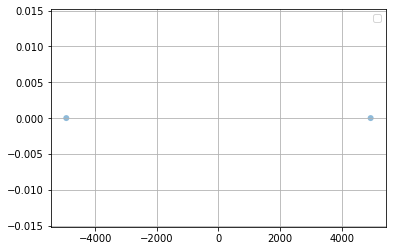

In [38]:
plot(demand_orlando_zip[['zip_lat','zip_lon']].values.T, v, u, c)

In [ ]:
from fcmeans import FCM

In [ ]:
demand_orlando[['lat_adr','lon_adr']].to_numpy()

In [ ]:
fuzzy_c_means = FCM(n_clusters=4) # we use two cluster as an example
fuzzy_c_means.fit(demand_orlando[['lat_adr','lon_adr']].to_numpy()) ## X, numpy array. rows:samples columns:features

In [281]:
n_samples = 3000

X = np.concatenate((
    np.random.normal((-2, -2), size=(n_samples, 2)),
    np.random.normal((2, 2), size=(n_samples, 2))
))

In [278]:
X

array([[-2.79223118, -2.14957943],
       [-1.90608467, -3.20653654],
       [-0.7724569 , -2.16797665],
       ...,
       [ 3.12672754,  2.5020757 ],
       [ 1.99857442,  1.69024909],
       [ 0.93174426,  3.02911431]])

In [282]:
fcm = FCM(n_clusters=2)
fcm.fit(X)

ValidationError: 1 validation error for Fit
X
  field required (type=value_error.missing)

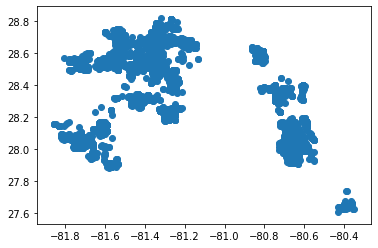

In [183]:
import matplotlib.pyplot as plt
plt.scatter(x=demand_orlando_zip_nooutliers['lon'], y=demand_orlando_zip_nooutliers['lat'])
plt.show()

In [190]:
demand_orlando_zip_nooutliers[['lat','lon']] = demand_orlando_zip_nooutliers[['lat','lon']].astype()

NameError: name 'numeric' is not defined

In [188]:
demand_orlando_zip_nooutliers.dtypes

service_order_id             object
service_order_number         object
addr_line_1                  object
address_city                 object
addr_state                   object
cust_zip                      int32
cust_adr_lat_lon             object
zip_lat                     float64
zip_lon                     float64
lat                         float64
lon                         float64
assigned_clusters_level1      int32
dtype: object

In [42]:
from sklearn.metrics.pairwise import haversine_distances
# result = haversine_distances(demand_orlando_zip_nooutliers[['lat','lon']].values)

In [43]:
import hdbscan
import seaborn as sns
from sklearn.metrics.pairwise import haversine_distances
distance_matrix = haversine_distances(demand_orlando_zip_nooutliers[['lat','lon']].values)

In [44]:
clusterer = hdbscan.HDBSCAN(metric='precomputed', min_cluster_size=100).fit(distance_matrix)
print(clusterer.labels_.max()+1)
color_palette = sns.color_palette('deep', clusterer.labels_.max() +1)
cluster_colors = [color_palette[x] if x >= 0
                  else (0.5, 0.5, 0.5)
                  for x in clusterer.labels_]
cluster_member_colors = [sns.desaturate(x, p) for x, p in
                         zip(cluster_colors, clusterer.probabilities_)]

18


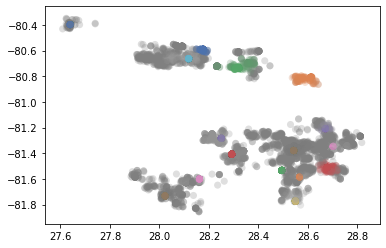

In [217]:
plt.scatter(x=demand_orlando_zip_nooutliers['lat'], y=demand_orlando_zip_nooutliers['lon'], s=50, linewidth=0, c=cluster_member_colors, alpha=0.25)

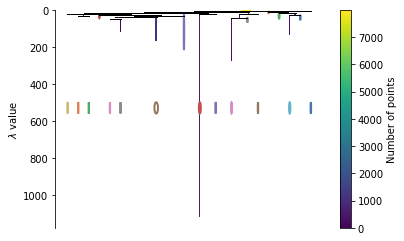

In [218]:
clusterer.condensed_tree_.plot(select_clusters=True,selection_palette=sns.color_palette('deep', clusterer.labels_.max() +1))

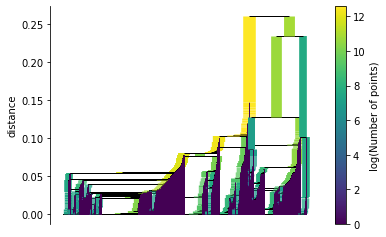

In [219]:
clusterer.single_linkage_tree_.plot()

In [220]:
clusterer.single_linkage_tree_.get_clusters(0.023, min_cluster_size=100)

array([ 2, -1,  4, ...,  0,  9, -1], dtype=int64)

In [189]:
X = np.radians(demand_orlando_zip_nooutliers[['lat','lon']].values) #convert the list of lat/lon coordinates to radians
earth_radius = 3958.7613
epsilon = 5 / earth_radius #calculate x miles epsilon threshold

clusterer = hdbscan.HDBSCAN(min_cluster_size=100, metric='haversine', 
                            cluster_selection_epsilon=epsilon,
                            cluster_selection_method = 'eom',
                           prediction_data=True
#                            ,min_samples=30
                           )
clusterer.fit(X)

HDBSCAN(algorithm='best', allow_single_cluster=False, alpha=1.0,
        approx_min_span_tree=True,
        cluster_selection_epsilon=0.0012630213395286045,
        cluster_selection_method='eom', core_dist_n_jobs=4,
        gen_min_span_tree=False, leaf_size=40,
        match_reference_implementation=False, memory=Memory(location=None),
        metric='haversine', min_cluster_size=100, min_samples=None, p=None,
        prediction_data=True)

In [190]:
max(clusterer.labels_)

5

In [192]:
# for x in soft_clusters:
#     print(np.argmax(x))
#     print(color_palette[np.argmax(x)])

In [201]:
np.max(soft_clusters[0])

nan

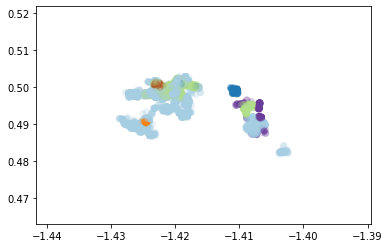

In [208]:
color_palette = sns.color_palette('Paired', 30)
cluster_colors = [color_palette[np.argmax(x)] for x in soft_clusters]
plt.scatter(x=np.radians(demand_orlando_zip_nooutliers['lon'].values), y=np.radians(demand_orlando_zip_nooutliers['lat'].values), s=50, linewidth=0, c=cluster_colors, alpha=0.25)

In [48]:
from hdbscan import flat
# n_clusters = 30
clusterer = flat.HDBSCAN_flat(X, 
                              n_clusters = None, 
                              prediction_data=True, 
                              min_cluster_size=20, 
                              metric='haversine', 
                              cluster_selection_epsilon=epsilon,
                              cluster_selection_method = 'eom',
                             min_samples=25)
labels, proba = flat.approximate_predict_flat(clusterer, X, n_clusters = 30)

In [53]:
demand_orlando_zip_nooutliers['hdbscan_labels'] = labels

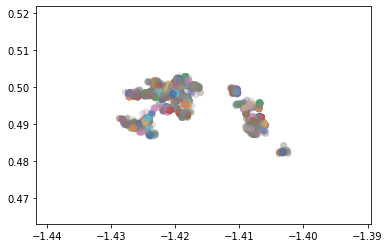

In [487]:
# color_palette = sns.color_palette('deep', clusterer.labels_.max() +1)
# cluster_colors = [color_palette[x] if x >= 0
#                   else (0.5, 0.5, 0.5)
#                   for x in clusterer.labels_]
# cluster_member_colors = [sns.desaturate(x, p) for x, p in
#                          zip(cluster_colors, clusterer.probabilities_)]

# plt.scatter(x=np.radians(demand_orlando_zip_nooutliers['lon'].values), y=np.radians(demand_orlando_zip_nooutliers['lat'].values), s=50, linewidth=0, c=cluster_member_colors, alpha=0.25)

In [488]:
# g = clusterer.condensed_tree_.to_networkx()
# g.number_of_nodes()

8525

In [406]:
# dendogram_df = clusterer.condensed_tree_.to_pandas()

In [55]:
demand_orlando_zip_nooutliers['color'] = color_scheme.assign_color(demand_orlando_zip_nooutliers.hdbscan_labels, mapping)

In [123]:
m_db = initialize_map(demand_orlando_zip_nooutliers.lat.iloc[0],demand_orlando_zip_nooutliers.lon.iloc[0], coverage)

In [124]:
HeatMap(demand_orlando_zip[['lat','lon']], name = 'Population Density').add_to(m_db)

In [125]:
# m_constraints = folium.Map(location=[demand_orlando_zip_nooutliers.lat.iloc[0],demand_orlando_zip_nooutliers.lon.iloc[0]], zoom_start=8, overlay=True)

for lt, ln, color in zip(demand_orlando_zip_nooutliers.lat, demand_orlando_zip_nooutliers.lon, demand_orlando_zip_nooutliers.color):
    cm = folium.CircleMarker(location=[lt, ln],
                            radius = 6,
#                             popup=str(el)+" m",
                            fill=True, # Set fill to True
                            fill_color=color,
                            color = color,
                            fill_opacity=0.7,
                            line_opacity=0.7,
                            name = 'Clusters',
                            control=True)
    m_db.add_child(cm)

In [126]:
# Adding layer controls to select which layers to display
folium.LayerControl().add_to(m_db)

In [403]:
m_db.save('Maps/orlando/dbscan.html')

In [439]:
# Higher value of min_samples results in more outliers

miles_per_radian = 3958.7613
epsilon = 1 / miles_per_radian
db = DBSCAN(eps=epsilon, min_samples=20, algorithm='ball_tree', metric='haversine').fit(np.radians(demand_orlando_zip_nooutliers[['lat','lon']].values))
cluster_labels = db.labels_
num_clusters = len(set(cluster_labels))
clusters = pd.Series([demand_orlando_zip_nooutliers[['lat','lon']][cluster_labels == n] for n in list(set(cluster_labels))])
print('Number of clusters: {}'.format(num_clusters))

Number of clusters: 42


In [440]:
len(cluster_labels)

7984

In [441]:
demand_orlando_zip_nooutliers['dbscan_labels'] = cluster_labels

demand_orlando_zip_nooutliers['dbscan_color'] = color_scheme.assign_color(demand_orlando_zip_nooutliers.dbscan_labels, mapping)

In [ ]:
coverage

In [85]:
m_db = initialize_map(demand_orlando_zip_nooutliers.lat.iloc[0],demand_orlando_zip_nooutliers.lon.iloc[0], )

TypeError: initialize_map() missing 1 required positional argument: 'coverage'

In [442]:
m_db = folium.Map(location=[demand_orlando_zip_nooutliers.lat.iloc[0],demand_orlando_zip_nooutliers.lon.iloc[0]], zoom_start=8, overlay=True)

for lt, ln, color in zip(demand_orlando_zip_nooutliers.lat, demand_orlando_zip_nooutliers.lon, demand_orlando_zip_nooutliers.dbscan_color):
    cm = folium.CircleMarker(location=[lt, ln],
                            radius = 6,
#                             popup=str(el)+" m",
                            fill=True, # Set fill to True
                            fill_color=color,
                            color = color,
                            fill_opacity=0.7,
                            line_opacity=0.7,
                            name = 'Clusters',
                            control=True)
    m_db.add_child(cm)